<h3 align="center"> Weed Detection with Fastai </h3>

<p <p style="text-align: center;"> This demo is for the Weed Classification Project at Fintricity <br/ >
To run this demo, you will need python3, pytorch and fastai libraries </p>

# 1/ Prepare the dataset

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from fastai.vision.all import * # fastai library for vision application
import matplotlib.pyplot as plt # for ploting
from glob import glob # for path function
import cv2 # opencv2 library for handling images

Define all directories that contain the dataset

In [5]:
pwd

'/home/kha/Documents/SugarBeetGrowth'

In [2]:
BASE_FOLDER = "/home/kha/Documents/SugarBeetGrowth/data"
base_path = Path(BASE_FOLDER)
train_path = Path(os.path.join(BASE_FOLDER, "train"))
valid_path = Path(os.path.join(BASE_FOLDER, "valid"))
test_path = Path(os.path.join(BASE_FOLDER, "test"))
model_path = Path("/home/kha/Documents/SugarBeetGrowth/models")

The structure of our dataset folder is:
    
    -->train
        --> Agrostemma-githago_Cotyledon
            --> image1.jpg
            --> image2.jpg
            -->...
        --> Agrostemma-githago_Foliage
        --> Agrostemma-githago_Intermediate
        --> Crepis-setosa_Cotyledon
        --> Crepis-setosa_Foliage
        --> Crepis-setosa_Intermediate
        --> Beta-vulgaris_Cotyledon
        --> Beta-vulgaris_Foliage
        --> Beta-vulgaris_Intermediate
    
    -->valid
        --> Agrostemma-githago_Cotyledon
            --> image1.jpg
            --> image2.jpg
            -->...
        --> Agrostemma-githago_Foliage
        --> Agrostemma-githago_Intermediate
        --> Crepis-setosa_Cotyledon
        --> Crepis-setosa_Foliage
        --> Crepis-setosa_Intermediate
        --> Beta-vulgaris_Cotyledon
        --> Beta-vulgaris_Foliage
        --> Beta-vulgaris_Intermediate
    
    -->test
        --> image1.jpg
        --> image2.jpg
        --> ...


# 2/ Training

The original image size is 3456x2304 (pixels). We want to resize (cropping) images into a square size without removing too much important details. We choose this size: 2304/3 = 768 pixel <br />
We use the API from fastai2 library to package the dataset. The images will be resized to 768*768 (pixels).

In [3]:
sugarbeet = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=GrandparentSplitter(),
    get_y=parent_label)

## 2.1/ Data augmentation: 
Transformation: rotation, flipping, perspective warping, brightness changes and contrast changes. 
Mult = 2 means max_rotate,max_lighting,max_warp are multiplied by 2. Because we do not do any zooming or stretching images, the perspective feature's size inside the images remains the same.

The default parameters are: 

**aug_transforms(mult=1.0, do_flip=True, flip_vert=False, max_rotate=10.0, min_zoom=1.0, max_zoom=1.1, max_lighting=0.2, max_warp=0.2, p_affine=0.75, p_lighting=0.75, xtra_tfms=None, size=None, mode='bilinear', pad_mode='reflection', align_corners=True, batch=False, min_scale=1.0)**

The batch_tfms (batch transform is applied only to training data)

In [4]:
sugarbeet = sugarbeet.new(item_tfms=Resize(768), batch_tfms=aug_transforms(mult=2))
dls = sugarbeet.dataloaders(base_path,bs=16)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

TypeError: 'NoneType' object is not iterable

Print out the classes (augmented list): first output is number of classes (9). The second output is a list of these classes

In [5]:
print(dls.vocab)

(#9) ['Agrostemma-githago_Cotyledon','Agrostemma-githago_Foliage','Agrostemma-githago_Intermediate','Beta-vulgaris_Cotyledon','Beta-vulgaris_Foliage','Beta-vulgaris_Intermediate','Crepis-setosa_Cotyledon','Crepis-setosa_Foliage','Crepis-setosa_Intermediate']


## Method 1: Using Mobilenet pretrained model (PyTorch model)

Calling the Mobilenetv2 model, the model will be save at *model_path which is /home/ec2-user/SageMaker/SugarBeetProject/models* defined above.

The Learner object has an optimizer default to be 'Adam' and loss_function to be 'CrossEntropyFlat" 

In [ ]:
# from mbnetv2 import mbnetv2, _mbnetv2_split
# learn = cnn_learner(dls, mbnetv2, cut=-1, split_on=_mbnetv2_split, metrics=accuracy)

#### Train it for 30 cycles using transfer learning methodology.
fine_tune method is a factory method that is optimized for transfer learning. <br/>
We first trained the last layer 1 cycle then 29 remaining cycles for all layers. 

In [6]:
# torch.cuda.empty_cache()

In [ ]:
# learn.fine_tune(30)

In [ ]:
# learn.save('mobilenet_stage1')

#### Confusion matrix of mobilenet model

In [ ]:
# learn = load_learner(model_path/'mobilenet.pkl')

In [ ]:
# interp = ClassificationInterpretation.from_learner(learn)
# interp.plot_confusion_matrix(figsize=(15,15), dpi=70)

#### Ploting the images which mobilenet predicted wrong on validation data.

In [ ]:
# interp.plot_top_losses(5,figsize=(15,15),nrows=3)

Save the model, name it *mobilenet_stage1*

In [ ]:
learn.save('mobilenet_stage1')

### Method 2: Using Resnet18 pretrained model (factory method of fastai)

In [9]:
learn2 = cnn_learner(dls, resnet34, metrics = accuracy, model_dir = model_path)

SuggestedLRs(lr_min=0.010000000149011612, lr_steep=0.004365158267319202)

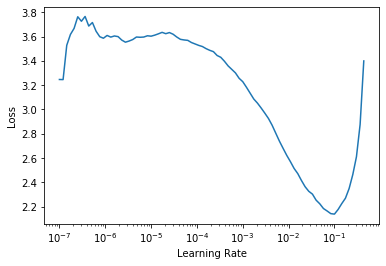

In [18]:
learn2.lr_find()

In [10]:
learn2.fine_tune(20,freeze_epochs=3)

epoch,train_loss,valid_loss,accuracy,time
0,3.356099,2.472973,0.206349,00:23
1,3.042194,1.575351,0.444444,00:23
2,2.429389,0.915492,0.730159,00:23


epoch,train_loss,valid_loss,accuracy,time
0,0.932467,0.865105,0.730159,00:28
1,0.921976,0.745837,0.730159,00:28
2,0.952457,0.590240,0.730159,00:28
3,0.880791,0.568766,0.809524,00:29
4,0.810433,0.549857,0.825397,00:28
5,0.732503,0.466684,0.825397,00:28
6,0.663378,0.346116,0.873016,00:28
7,0.551966,0.381117,0.873016,00:29
8,0.488039,0.309574,0.888889,00:28
9,0.428033,0.265002,0.888889,00:28


In [48]:
learn2.save('resnet34_stage1')

#### Confusion matrix for resnet18 model

In [ ]:
# learn2.load("resnet18_stage1")

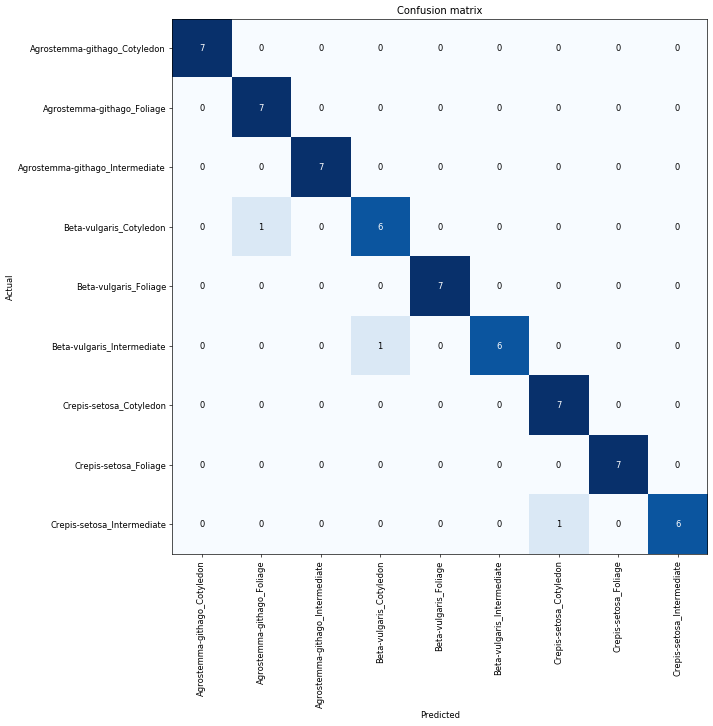

In [49]:
interp2 = ClassificationInterpretation.from_learner(learn2)
interp2.plot_confusion_matrix(figsize=(12,12), dpi=60)

Ploting the images which resnet18 predicted wrong on validation data.

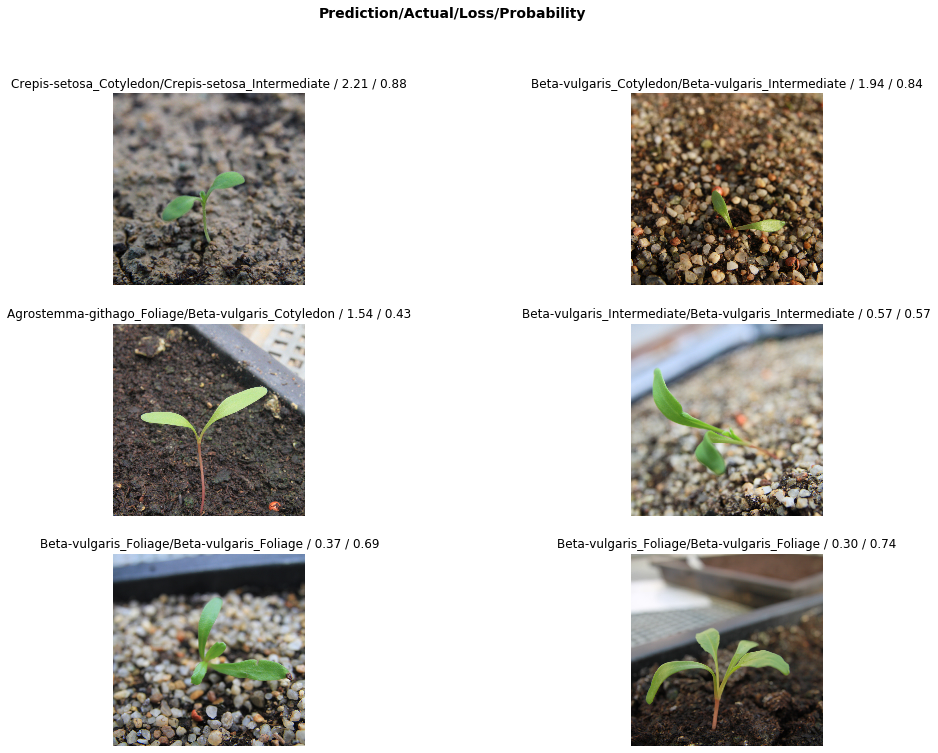

In [22]:
interp2.plot_top_losses(6,figsize=(17,12),nrows=3)

Export the model, name it *model_name.pkl*

In [50]:
# learn.export(model_path/'mobilenet.pkl')
learn2.export(model_path/'resnet34.pkl')

# Create Dataframe for test folder

In [51]:
imgs = get_image_files(test_path)
test_data = learn2.dls.test_dl(imgs)
preds,y = learn2.get_preds(dl=test_data)

In [17]:
predict = np.argmax(preds, axis = 1)

In [18]:
confidence = []
for i in range(0,18):
    confidence.append(float(preds[i][int(predict[i])]))

In [19]:
preds_classes = [dls.vocab[i] for i in predict]

In [45]:
submission = pd.DataFrame({ 'image_name': os.listdir(test_path), 'prediction': preds_classes, 'confidence' : confidence })
submission.to_csv('test_classification_results.csv', index=False)
submission

,image_name,prediction,confidence
0,Agrostemma-githago_Intermediate_Substrat3_19022020 (29).JPG,Agrostemma-githago_Intermediate,0.998156
1,Beta-vulgaris_Foliage_Substrat1_04112019 (10).JPG,Beta-vulgaris_Foliage,0.999116
2,Crepis-setosa_Foliage_Substrat1_17022020 (121).JPG,Crepis-setosa_Intermediate,0.607399
3,Crepis -setosa_Cotyledon_Substrat3_29012020 (116).JPG,Crepis-setosa_Cotyledon,0.931691
4,Agrostemma-githago_Cotyledon_Substrat3_12022020 (258).JPG,Agrostemma-githago_Cotyledon,0.955444
5,Beta-vulgaris_Intermediate_Substrat1_01092019 (25).JPG,Beta-vulgaris_Intermediate,0.999341
6,Agrostemma-githago_Foliage_Substrat3_28022020 (73).JPG,Agrostemma-githago_Foliage,0.999994
7,Agrostemma-githago_Cotyledon_Substrat3_12022020 (229).JPG,Agrostemma-githago_Cotyledon,0.987080
8,Crepis-setosa_Foliage_Substrat1_17022020 (1).JPG,Crepis-setosa_Foliage,0.644444
9,Beta-vulgaris_Cotyledon_Substrat1_07102019 (9).JPG,Beta-vulgaris_Cotyledon,0.843376


In [ ]:
# submission2 = pd.DataFrame({ 'image_name': os.listdir(test_path), 'prediction': preds_classes, 'confidence' : confidence })
# submission2.to_csv('test_classification_results_mobilenet.csv', index=False)
# submission2

## Export model and upload to S3
Now that we have trained our model we need to export it, create a tarball of the artefacts and upload to S3.

First we need to get the S3 bucket and prefix where the model will be uploaded to.

In [33]:
export_path = Path('/home/ec2-user/SageMaker/SugarBeetGrowth/models')

Compress the *.pkl* file

In [52]:
import tarfile
with tarfile.open(export_path/'model.tar.gz', 'w:gz') as f:
    f.add(export_path/'resnet34.pkl', arcname='model.pkl')

Define sagemaker required parameters in order to upload model artefact to S3 

In [53]:
import sagemaker
role = sagemaker.get_execution_role()
sess = sagemaker.Session()
prefix = 'resnet34-sagemaker-sugarbeet'

In [54]:
model_location = sess.upload_data(str(export_path/'model.tar.gz'), key_prefix=prefix)
model_location

's3://sagemaker-eu-west-1-993042807048/resnet34-sagemaker-sugarbeet/model.tar.gz'

Create the model for inference. Serve.py script:

In [37]:
!pygmentize scripts/serve.py

# Copyright 2017-2018 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License"). You
# may not use this file except in compliance with the License. A copy of
# the License is located at
#
#     http://aws.amazon.com/apache2.0/
#
# or in the "license" file accompanying this file. This file is
# distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF
# ANY KIND, either express or implied. See the License for the specific
# language governing permissions and limitations under the License.

import logging
import json
import io
import os

from fastai2.vision.all import *

logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)

JSON_CONTENT_TYPE = 'application/json'
EXPORT_MODEL_NAME = 'model.pkl'

# loads the model into memory from disk and returns it
def model_fn(model_dir):
    logger.info('model_fn')
    path_model = Path(model_dir)
    logger.debug(f'Loading model from path: {str(path_model/EXPOR

In [55]:
from sagemaker.pytorch import PyTorchModel

model = PyTorchModel(model_data=model_location,
                     role=role,
                     framework_version='1.4.0',
                     entry_point='serve.py', 
                     source_dir='scripts')

Parameter image will be renamed to image_uri in SageMaker Python SDK v2.


Deploy the endpoint to Sagemaker, it will take some minutes to finish

In [39]:
predictor = model.deploy(initial_instance_count=1, instance_type='ml.m4.xlarge')

'create_image_uri' will be deprecated in favor of 'ImageURIProvider' class in SageMaker Python SDK v2.


-----------------!

Download some images from somewhere (need a URL) and store it inside a folder named */tmp*

In [41]:
# ! [ -d tmp ] || mkdir tmp
# ! wget -q -O tmp/Agrostemma-githago_Cotyledon1.jpg https://www.dropbox.com/s/wrl6ehdivktfz3p/Agrostemma-githago_Cotyledon_Substrat3_12022020%20%28229%29.JPG?raw=1
# ! wget -q -O tmp/Agrostemma-githago_Cotyledon2.jpg https://www.dropbox.com/s/1t3enu6vjbxr1zr/Agrostemma-githago_Cotyledon_Substrat3_12022020%20%28258%29.JPG?raw=1
# ! wget -q -O tmp/Agrostemma-githago_Foliage1.jpg https://www.dropbox.com/s/gx7aq2eyrt0l5s5/Agrostemma-githago_Foliage_Substrat3_28022020%20%2873%29.JPG?raw=1
# ! wget -q -O tmp/Agrostemma-githago_Foliage2.jpg https://www.dropbox.com/s/8rd35rn1aj5mxe1/Agrostemma-githago_Foliage_Substrat3_28022020%20%28216%29.JPG?raw=1   
# ! wget -q -O tmp/Agrostemma-githago_Intermediate1.jpg https://www.dropbox.com/s/h8256ag2hwssdui/Agrostemma-githago_Intermediate_Substrat3_19022020%20%2829%29.JPG?raw=1
# ! wget -q -O tmp/Agrostemma-githago_Intermediate2.jpg https://www.dropbox.com/s/zh5ps93g1xdl5po/Agrostemma-githago_Intermediate_Substrat3_19022020%20%2863%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Cotyledon1.jpg https://www.dropbox.com/s/1ilv2qazazsk9q3/Beta-vulgaris_Cotyledon_Substrat1_07102019%20%289%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Cotyledon2.jpg https://www.dropbox.com/s/2iwsuccg2e6qdum/Beta-vulgaris_Cotyledon_Substrat1_07102019_darker%20%281%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Foliage1.jpg https://www.dropbox.com/s/eoop3rnvukiaz9u/Beta-vulgaris_Foliage_Substrat1_04112019%20%2810%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Foliage2.jpg https://www.dropbox.com/s/kvwzmsc6nr9xsv5/Beta-vulgaris_Foliage_Substrat1_04112019%20%2817%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Intermediate1.jpg https://www.dropbox.com/s/z5w9odscqkafxp8/Beta-vulgaris_Intermediate_Substrat1_01092019%20%2825%29.JPG?raw=1
# ! wget -q -O tmp/Beta-vulgaris_Intermediate2.jpg https://www.dropbox.com/s/slx8ss6a0ogbdix/Beta-vulgaris_Intermediate_Substrat1_01092019%20%2851%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Cotyledon1.jpg https://www.dropbox.com/s/6u7wldxfqwoiby0/Crepis%20-setosa_Cotyledon_Substrat3_29012020%20%28107%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Cotyledon2.jpg https://www.dropbox.com/s/fpmxgbkt5wjqmrm/Crepis%20-setosa_Cotyledon_Substrat3_29012020%20%28116%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Foliage1.jpg https://www.dropbox.com/s/c3gmm8b08v821qu/Crepis-setosa_Foliage_Substrat1_17022020%20%281%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Foliage2.jpg https://www.dropbox.com/s/xqtb4g26wj3y4ob/Crepis-setosa_Foliage_Substrat1_17022020%20%28121%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Intermediate1.jpg https://www.dropbox.com/s/jvtt2mzegn63jhb/Crepis-setosa_Intermediate_Substrat1_05022020%20%281%29.JPG?raw=1
# ! wget -q -O tmp/Crepis-setosa_Intermediate2.jpg https://www.dropbox.com/s/hh9kjxj55c15uk9/Crepis-setosa_Intermediate_Substrat1_05022020%20%28114%29.JPG?raw=1

In [ ]:
# link1 = 'https://www.dropbox.com/s/wrl6ehdivktfz3p/Agrostemma-githago_Cotyledon_Substrat3_12022020%20%28229%29.JPG?raw=1'
# link2 = 'https://www.dropbox.com/s/1t3enu6vjbxr1zr/Agrostemma-githago_Cotyledon_Substrat3_12022020%20%28258%29.JPG?raw=1'
# link3 = 'https://www.dropbox.com/s/gx7aq2eyrt0l5s5/Agrostemma-githago_Foliage_Substrat3_28022020%20%2873%29.JPG?raw=1'
# link4 = 'https://www.dropbox.com/s/8rd35rn1aj5mxe1/Agrostemma-githago_Foliage_Substrat3_28022020%20%28216%29.JPG?raw=1'
# link5 = 'https://www.dropbox.com/s/h8256ag2hwssdui/Agrostemma-githago_Intermediate_Substrat3_19022020%20%2829%29.JPG?raw=1'
# link6 = 'https://www.dropbox.com/s/zh5ps93g1xdl5po/Agrostemma-githago_Intermediate_Substrat3_19022020%20%2863%29.JPG?raw=1'
# link7 = 'https://www.dropbox.com/s/1ilv2qazazsk9q3/Beta-vulgaris_Cotyledon_Substrat1_07102019%20%289%29.JPG?raw=1'
# link8 = 'https://www.dropbox.com/s/2iwsuccg2e6qdum/Beta-vulgaris_Cotyledon_Substrat1_07102019_darker%20%281%29.JPG?raw=1'
# link9 = 'https://www.dropbox.com/s/eoop3rnvukiaz9u/Beta-vulgaris_Foliage_Substrat1_04112019%20%2810%29.JPG?raw=1'
# link10 = 'https://www.dropbox.com/s/kvwzmsc6nr9xsv5/Beta-vulgaris_Foliage_Substrat1_04112019%20%2817%29.JPG?raw=1'
# link11 = 'https://www.dropbox.com/s/z5w9odscqkafxp8/Beta-vulgaris_Intermediate_Substrat1_01092019%20%2825%29.JPG?raw=1'
# link12 = 'https://www.dropbox.com/s/slx8ss6a0ogbdix/Beta-vulgaris_Intermediate_Substrat1_01092019%20%2851%29.JPG?raw=1'
# link13 = 'https://www.dropbox.com/s/6u7wldxfqwoiby0/Crepis%20-setosa_Cotyledon_Substrat3_29012020%20%28107%29.JPG?raw=1'
# link14 = 'https://www.dropbox.com/s/fpmxgbkt5wjqmrm/Crepis%20-setosa_Cotyledon_Substrat3_29012020%20%28116%29.JPG?raw=1'
# link15 = 'https://www.dropbox.com/s/c3gmm8b08v821qu/Crepis-setosa_Foliage_Substrat1_17022020%20%281%29.JPG?raw=1'
# link16 = 'https://www.dropbox.com/s/xqtb4g26wj3y4ob/Crepis-setosa_Foliage_Substrat1_17022020%20%28121%29.JPG?raw=1'
# link17 = 'https://www.dropbox.com/s/jvtt2mzegn63jhb/Crepis-setosa_Intermediate_Substrat1_05022020%20%281%29.JPG?raw=1'
# link18 = 'https://www.dropbox.com/s/hh9kjxj55c15uk9/Crepis-setosa_Intermediate_Substrat1_05022020%20%28114%29.JPG?raw=1'

## Test 1

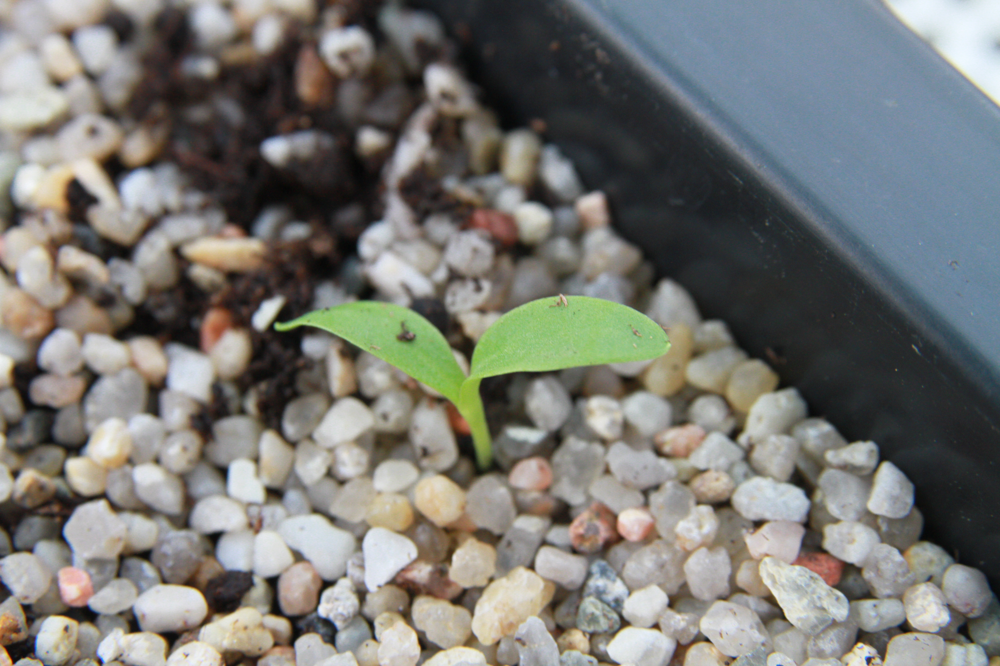

In [42]:
img = Image.open('tmp/Agrostemma-githago_Cotyledon1.jpg')
img

Test the predictor. We throw in some data which the model has never seen before, wait to see it react...

In [43]:
from sagemaker.predictor import json_serializer, json_deserializer

predictor.accept = 'application/json'
predictor.content_type = 'application/json'

predictor.serializer = json_serializer
predictor.deserializer = json_deserializer

response = predictor.predict( { "url": 'https://www.dropbox.com/s/wrl6ehdivktfz3p/Agrostemma-githago_Cotyledon_Substrat3_12022020%20%28229%29.JPG?raw=1' })
print(response)

{'class': 'Agrostemma-githago_Cotyledon', 'confidence': 0.9870796799659729}


Good result!

# Cleaning up

To save cost, we need to delete the endpoint after using it.

In [44]:
predictor.delete_endpoint()